In [1]:
from astropy.io import ascii
from astropy.table import Table
from astropy.table import vstack
from astropy.table import join
from astropy import units as u

import sys
import os
import re
import numpy as np
import pandas as pd
import pylab
import json
import requests
import matplotlib.pyplot as plt
import timeit
import subprocess
from scipy.stats import chi2
from scipy.optimize import minimize
import scipy.integrate as integrate
import scipy.interpolate as interpolate
import emcee
import corner

from urllib.parse import quote as urlencode
from urllib.request import urlretrieve
import http.client as httplib 

import pysynphot as ps
from __future__ import print_function
from PIL import Image
from io import BytesIO

from astropy.io import fits
from astropy.visualization import PercentileInterval, AsinhStretch

from multiprocessing import Pool

%matplotlib inline

deg_to_rad_conv = np.pi / 180


/home/thorsten/.local/lib/python3.9/site-packages/pysynphot/locations.py:46: UserWarning: PYSYN_CDBS is undefined; functionality will be SEVERELY crippled.
  warnings.warn("PYSYN_CDBS is undefined; functionality will be SEVERELY "
/home/thorsten/.local/lib/python3.9/site-packages/pysynphot/locations.py:345: UserWarning: Extinction files not found in extinction
  warnings.warn('Extinction files not found in %s' % (extdir, ))


# Defined Functions

In [4]:
def checkfile(ra, dec, radius):
    matchingFile = None
    for file in os.listdir(os.getcwd() + "/Panstarrs/"):
        if file.endswith(".csv"):
            try:
                if len(file.split("+")) > 1:
                    ra_file = float(file.split("+")[0])
                    dec_file = float(file.split("+")[1].split("r")[0])
                    rad_file = float(file.split("+")[1].split("r")[1][:-4])
                else:
                    ra_file = float(file.split("-")[0])
                    dec_file = -float(file.split("-")[1].split("r")[0])
                    rad_file = float(file.split("-")[1].split("r")[1][:-4])
                if np.sqrt((ra_file - ra)**2 + (dec_file - dec)**2) <= rad_file / 60 - 0.8 * radius:
                    matchingFile = file
                    print(matchingFile)
                    break
            except:
                continue
    return(matchingFile)

In [7]:
def check_distance(ra1, dec1, ra2, dec2):
    ra1 = ra1 * deg_to_rad_conv
    ra2 = ra2 * deg_to_rad_conv
    dec1 = dec1 * deg_to_rad_conv
    dec2 = dec2 * deg_to_rad_conv
    return np.arccos(np.sin(dec1)*np.sin(dec2)+np.cos(dec1)*np.cos(dec2)*np.cos(ra2-ra1)) / deg_to_rad_conv

In [9]:
def magToFlux(mag):
    return 10**(23-(mag+48.6)/2.5)
#F/Jy=10(23-(AB+48.6)/2.5)
def magErrToFlux(mag, magERR):
    return 3344.07 * np.exp(-0.921034*mag) * magERR

In [31]:
def chisqfunc(a, fluxes_chi, temp_chi, errs_chi):
    chisq = np.sum(((fluxes_chi - a * temp_chi)/errs_chi)**2)
    return chisq

In [32]:
def JyToFlambda(flux, wave):
    flux = flux * 2.99792458e18 * u.Angstrom / u.s / wave**2
    flux = flux.to(u.erg / u.s / u.cm**2 / u.Angstrom)
    return flux

# Panstarrs Query

In [2]:
def getimages(ra,dec,size=240,filters="grizy"):
    
    """Query ps1filenames.py service to get a list of images
    
    ra, dec = position in degrees
    size = image size in pixels (0.25 arcsec/pixel)
    filters = string with filters to include
    Returns a table with the results
    """
    
    service = "https://ps1images.stsci.edu/cgi-bin/ps1filenames.py"
    url = ("{service}?ra={ra}&dec={dec}&size={size}&format=fits"
           "&filters={filters}").format(**locals())
    table = Table.read(url, format='ascii')
    return table


def geturl(ra, dec, size=240, output_size=None, filters="grizy", format="jpg", color=False):
    
    """Get URL for images in the table
    
    ra, dec = position in degrees
    size = extracted image size in pixels (0.25 arcsec/pixel)
    output_size = output (display) image size in pixels (default = size).
                  output_size has no effect for fits format images.
    filters = string with filters to include
    format = data format (options are "jpg", "png" or "fits")
    color = if True, creates a color image (only for jpg or png format).
            Default is return a list of URLs for single-filter grayscale images.
    Returns a string with the URL
    """
    
    if color and format == "fits":
        raise ValueError("color images are available only for jpg or png formats")
    if format not in ("jpg","png","fits"):
        raise ValueError("format must be one of jpg, png, fits")
    table = getimages(ra,dec,size=size,filters=filters)
    url = ("https://ps1images.stsci.edu/cgi-bin/fitscut.cgi?"
           "ra={ra}&dec={dec}&size={size}&format={format}").format(**locals())
    if output_size:
        url = url + "&output_size={}".format(output_size)
    # sort filters from red to blue
    flist = ["yzirg".find(x) for x in table['filter']]
    table = table[np.argsort(flist)]
    if color:
        if len(table) > 3:
            # pick 3 filters
            table = table[[0,len(table)//2,len(table)-1]]
        for i, param in enumerate(["red","green","blue"]):
            url = url + "&{}={}".format(param,table['filename'][i])
    else:
        urlbase = url + "&red="
        url = []
        for filename in table['filename']:
            url.append(urlbase+filename)
    return url


def getcolorim(ra, dec, size=240, output_size=None, filters="grizy", format="jpg"):
    
    """Get color image at a sky position
    
    ra, dec = position in degrees
    size = extracted image size in pixels (0.25 arcsec/pixel)
    output_size = output (display) image size in pixels (default = size).
                  output_size has no effect for fits format images.
    filters = string with filters to include
    format = data format (options are "jpg", "png")
    Returns the image
    """
    
    if format not in ("jpg","png"):
        raise ValueError("format must be jpg or png")
    url = geturl(ra,dec,size=size,filters=filters,output_size=output_size,format=format,color=True)
    r = requests.get(url)
    im = Image.open(BytesIO(r.content))
    return im


def getgrayim(ra, dec, size=240, output_size=None, filter="g", format="jpg"):
    
    """Get grayscale image at a sky position
    
    ra, dec = position in degrees
    size = extracted image size in pixels (0.25 arcsec/pixel)
    output_size = output (display) image size in pixels (default = size).
                  output_size has no effect for fits format images.
    filter = string with filter to extract (one of grizy)
    format = data format (options are "jpg", "png")
    Returns the image
    """
    
    if format not in ("jpg","png"):
        raise ValueError("format must be jpg or png")
    if filter not in list("grizy"):
        raise ValueError("filter must be one of grizy")
    url = geturl(ra,dec,size=size,filters=filter,output_size=output_size,format=format)
    r = requests.get(url[0])
    im = Image.open(BytesIO(r.content))
    return im

In [3]:
def ps1cone(ra,dec,radius,table="mean",release="dr1",format="csv",columns=None,
           baseurl="https://catalogs.mast.stsci.edu/api/v0.1/panstarrs", verbose=False,
           **kw):
    """Do a cone search of the PS1 catalog
    
    Parameters
    ----------
    ra (float): (degrees) J2000 Right Ascension
    dec (float): (degrees) J2000 Declination
    radius (float): (degrees) Search radius (<= 0.5 degrees)
    table (string): mean, stack, or detection
    release (string): dr1 or dr2
    format: csv, votable, json
    columns: list of column names to include (None means use defaults)
    baseurl: base URL for the request
    verbose: print info about request
    **kw: other parameters (e.g., 'nDetections.min':2)
    """
    
    data = kw.copy()
    data['ra'] = ra
    data['dec'] = dec
    data['radius'] = radius
    return ps1search(table=table,release=release,format=format,columns=columns,
                    baseurl=baseurl, verbose=verbose, **data)


def ps1search(table="mean",release="dr1",format="csv",columns=None,
           baseurl="https://catalogs.mast.stsci.edu/api/v0.1/panstarrs", verbose=False,
           **kw):
    """Do a general search of the PS1 catalog (possibly without ra/dec/radius)
    
    Parameters
    ----------
    table (string): mean, stack, or detection
    release (string): dr1 or dr2
    format: csv, votable, json
    columns: list of column names to include (None means use defaults)
    baseurl: base URL for the request
    verbose: print info about request
    **kw: other parameters (e.g., 'nDetections.min':2).  Note this is required!
    """
    
    data = kw.copy()
    if not data:
        raise ValueError("You must specify some parameters for search")
    checklegal(table,release)
    if format not in ("csv","votable","json"):
        raise ValueError("Bad value for format")
    url = "{baseurl}/{release}/{table}.{format}".format(**locals())
    if columns:
        # check that column values are legal
        # create a dictionary to speed this up
        dcols = {}
        for col in ps1metadata(table,release)['name']:
            dcols[col.lower()] = 1
        badcols = []
        for col in columns:
            if col.lower().strip() not in dcols:
                badcols.append(col)
        if badcols:
            raise ValueError('Some columns not found in table: {}'.format(', '.join(badcols)))
        # two different ways to specify a list of column values in the API
        # data['columns'] = columns
        data['columns'] = '[{}]'.format(','.join(columns))

# either get or post works
#    r = requests.post(url, data=data)
    r = requests.get(url, params=data)

    if verbose:
        print(r.url)
    r.raise_for_status()
    if format == "json":
        return r.json()
    else:
        return r.text


def checklegal(table,release):
    """Checks if this combination of table and release is acceptable
    
    Raises a VelueError exception if there is problem
    """
    
    releaselist = ("dr1", "dr2")
    if release not in ("dr1","dr2"):
        raise ValueError("Bad value for release (must be one of {})".format(', '.join(releaselist)))
    if release=="dr1":
        tablelist = ("mean", "stack")
    else:
        tablelist = ("mean", "stack", "detection")
    if table not in tablelist:
        raise ValueError("Bad value for table (for {} must be one of {})".format(release, ", ".join(tablelist)))


def ps1metadata(table="mean",release="dr1",
           baseurl="https://catalogs.mast.stsci.edu/api/v0.1/panstarrs"):
    """Return metadata for the specified catalog and table
    
    Parameters
    ----------
    table (string): mean, stack, or detection
    release (string): dr1 or dr2
    baseurl: base URL for the request
    
    Returns an astropy table with columns name, type, description
    """
    
    checklegal(table,release)
    url = "{baseurl}/{release}/{table}/metadata".format(**locals())
    r = requests.get(url)
    r.raise_for_status()
    v = r.json()
    # convert to astropy table
    tab = Table(rows=[(x['name'],x['type'],x['description']) for x in v],
               names=('name','type','description'))
    return tab


def mastQuery(request):
    """Perform a MAST query.

    Parameters
    ----------
    request (dictionary): The MAST request json object

    Returns head,content where head is the response HTTP headers, and content is the returned data
    """
    
    server='mast.stsci.edu'

    # Grab Python Version 
    version = ".".join(map(str, sys.version_info[:3]))

    # Create Http Header Variables
    headers = {"Content-type": "application/x-www-form-urlencoded",
               "Accept": "text/plain",
               "User-agent":"python-requests/"+version}

    # Encoding the request as a json string
    requestString = json.dumps(request)
    requestString = urlencode(requestString)
    
    # opening the https connection
    conn = httplib.HTTPSConnection(server)

    # Making the query
    conn.request("POST", "/api/v0/invoke", "request="+requestString, headers)

    # Getting the response
    resp = conn.getresponse()
    head = resp.getheaders()
    content = resp.read().decode('utf-8')

    # Close the https connection
    conn.close()

    return head,content


def resolve(name):
    """Get the RA and Dec for an object using the MAST name resolver
    
    Parameters
    ----------
    name (str): Name of object

    Returns RA, Dec tuple with position"""

    resolverRequest = {'service':'Mast.Name.Lookup',
                       'params':{'input':name,
                                 'format':'json'
                                },
                      }
    headers,resolvedObjectString = mastQuery(resolverRequest)
    resolvedObject = json.loads(resolvedObjectString)
    # The resolver returns a variety of information about the resolved object, 
    # however for our purposes all we need are the RA and Dec
    try:
        objRa = resolvedObject['resolvedCoordinate'][0]['ra']
        objDec = resolvedObject['resolvedCoordinate'][0]['decl']
    except IndexError as e:
        raise ValueError("Unknown object '{}'".format(name))
    return (objRa, objDec)

In [8]:
# selected coordinates, radius and threshold for cross matching

ra = 150.11916667 #197.450341598  # 2017gfo (counterpart to GW170817)
dec = 2.20583333 #-23.3814675445
radius = 1/3
threshold = 1/3600

In [5]:
# Finally, we can do a catalog query, looking at the region around AT2017gfo (the counterpart to GW170817)

file = checkfile(ra, dec, radius)
            
if file:
    tab = ascii.read(os.getcwd() + "/Panstarrs/" + file)
    #pd.read_csv(file)    
    
else:
    # We can apply constraints here. In this example we want more than one detection of a source
    constraints = {'nDetections.gt':1}

    # List the columns we want to get from the database
    columns = """objID,raMean,decMean,nDetections,
                 ng,nr,ni,nz,ny,
                 gPSFMag,gPSFMagErr,gKronMag,gKronMagErr,
                 gKronFlux, gKronFluxErr,
                 rPSFMag,rPSFMagErr,rKronMag,rKronMagErr,
                 rKronFlux, rKronFluxErr,
                 iPSFMag,iPSFMagErr,iKronMag,iKronMagErr,
                 iKronFlux, iKronFluxErr,
                 zPSFMag,zPSFMagErr,zKronMag,zKronMagErr,
                 zKronFlux, zKronFluxErr,
                 yPSFMag,yPSFMagErr,yKronMag,yKronMagErr,
                 yKronFlux, yKronFluxErr,
                 qualityFlag, SkyCellID""".split(',')


    # strip blanks and weed out blank and commented-out values
    columns = [x.strip() for x in columns]
    columns = [x for x in columns if x and not x.startswith('#')]

    # Do search
    results = ps1cone(ra,dec,radius,table="stack",release='dr2',columns=columns,verbose=True,**constraints)
    
    if dec >= 0:
        filename = "{:1.4f}".format(ra) + "+" + "{:1.4f}".format(dec) + "r" + "{:1.1f}".format(60 * radius) + ".csv"
    else:
        filename = "{:1.4f}".format(ra) + "{:1.4f}".format(dec) + "r" + "{:1.1f}".format(60 * radius) + ".csv"
        
    lines = results.split('\n')
    result_dat = ascii.read(results)
    #result_dat.to_csv(filename)
    ascii.write(result_dat, "Panstarrs/" + filename)
    tab = ascii.read(results)
    
    
    
    # print first few lines
    
    print(len(lines),"rows in results -- first 5 rows:")
    print('\n'.join(lines[:6]))


150.1192+2.2058r20.0.csv


In [6]:
# Filter extended sources that have difference more than 0.1 mag in their g-band Kron and PSF mag
# You can probably modify this to take absolute values, or look for sources that differ by more than
# the combined uncertainty on PSF and Kron mag

sources = tab[(tab['gKronMag'] - tab['gPSFMag']<-(np.sqrt(tab['gKronMagErr']**2 + tab['gPSFMagErr']**2) * 3)) &
    (tab['gPSFMag']<21) & (tab['gKronMag']>0) & (tab['qualityFlag'] < 100)]
print(sources)

      objID           raMean     decMean   ... qualityFlag SkyCellID
------------------ ------------ ---------- ... ----------- ---------
110761499937035282 149.99372939 2.30403297 ...          53        50
110761499937035282 149.99372939 2.30403297 ...          53        50
110771499054011847 149.90543558 2.30958841 ...          53        50
110581498345647085 149.83458605 2.15553979 ...          60        50
110861499256316038 149.92565053  2.3880196 ...          53        50
110861499256316038 149.92565053  2.3880196 ...          53        50
110591500370209794 150.03699142 2.16610373 ...          53        59
110291499958825959  149.9958888 1.91290653 ...          53        40
110291499958825959  149.9958888 1.91290653 ...          53        40
110291500243443720 150.02434607 1.91103971 ...          53        49
               ...          ...        ... ...         ...       ...
110751500903113038 150.09026251  2.2938181 ...          53        59
110761499099759791 149.91000012 2.

# Cross Matching

In [10]:
mass2_data = ascii.read("2mass.csv")

In [11]:
wise_data = ascii.read("wise.csv")

In [12]:
mass_matches = [(source_pan, source_mass) for source_mass in mass2_data 
           for source_pan in sources 
           if check_distance(source_pan["raMean"], source_pan["decMean"], source_mass["ra"], source_mass["dec"]) < threshold]

mass_wise_matches = []
for item in mass_matches:
    for d in wise_data:
        if check_distance(item[0]["raMean"], item[0]["decMean"], d["ra"], d["dec"]) < threshold:
            mass_wise_matches.append((item[0], item[1], d))
            break

In [13]:
for i, item in enumerate(mass_wise_matches):
    
    if item[1]["dec"] == mass_wise_matches[i-1][1]["dec"]:
        continue
    
    for i in range(len(item[1])):
        if item[1][i] == "null":
            item[1][i] = 22
    for i in range(len(item[2])):
        if item[2][i] == "null":
            item[2][i] = 22
            
    item[1]["j_cmsig"] = float(item[1]["j_cmsig"])
    item[1]["h_cmsig"] = float(item[1]["h_cmsig"])
    item[1]["k_cmsig"] = float(item[1]["k_cmsig"])
    item[1]["j_m"] = float(item[1]["j_m"])
    item[1]["h_m"] = float(item[1]["h_m"])
    item[1]["k_m"] = float(item[1]["k_m"])
    
    item[1]["j_m"] = magToFlux(item[1]["j_m"] + 0.885)
    item[1]["h_m"] = magToFlux(item[1]["h_m"] + 1.362)
    item[1]["k_m"] = magToFlux(item[1]["k_m"] + 1.830)
    j_err = item[1]["j_m"] * float(item[1]["j_cmsig"])
    h_err = item[1]["h_m"] * float(item[1]["h_cmsig"])
    k_err = item[1]["k_m"] * float(item[1]["k_cmsig"])
    
    item[1]["j_cmsig"] = "{:5.0e}".format(j_err)
    item[1]["h_cmsig"] = "{:5.0e}".format(h_err)
    item[1]["k_cmsig"] = "{:5.0e}".format(k_err)
    
    item[2]["w1mpro"] = magToFlux(item[2]["w1mpro"] + 2.661)
    item[2]["w2mpro"] = magToFlux(item[2]["w2mpro"] + 3.301)
    item[2]["w3mpro"] = magToFlux(item[2]["w3mpro"] + 5.135) 
    w1_err = item[2]["w1mpro"] * float(item[2]["w1sigmpro"])
    w2_err = item[2]["w2mpro"] * float(item[2]["w2sigmpro"])
    w3_err = item[2]["w3mpro"] * float(item[2]["w3sigmpro"])
    
    item[2]["w1sigmpro"] = "{:5.0e}".format(w1_err)
    item[2]["w2sigmpro"] = "{:5.0e}".format(w2_err)
    item[2]["w3sigmpro"] = "{:5.0e}".format(w3_err) 

# Preparing Templates

In [22]:
filter_response = np.genfromtxt("filter_response.txt")
# multiply by 10 to convert to Angstrom from nm
filter_g = filter_response[0:721].transpose() * 10
filter_r = filter_response[721:2*721].transpose() * 10
filter_i = filter_response[721*2:3*721].transpose() * 10
filter_y = filter_response[721*3:4*721].transpose() * 10
filter_z = filter_response[721*4:5*721].transpose() * 10

In [23]:
w1_response = np.genfromtxt("RSR-W1.txt").transpose()
w1_response[0] = w1_response[0] * 10000
w1_filter = w1_response[:-1]
w2_response = np.genfromtxt("RSR-W2.txt").transpose()
w2_response[0] = w2_response[0] * 10000
w2_filter = w2_response[:-1]
w3_response = np.genfromtxt("RSR-W3.txt").transpose()
w3_response[0] = w3_response[0] * 10000
w3_filter = w3_response[:-1]

In [24]:
j_filter = np.genfromtxt("2MASS_2MASS.J.dat").transpose()
h_filter = np.genfromtxt("2MASS_2MASS.H.dat").transpose()
k_filter = np.genfromtxt("2MASS_2MASS.Ks.dat").transpose()

In [25]:
grid_size = 0.005
z_grid = np.arange(0, 6, grid_size)

In [26]:
templates = []

for i in range(1,7):
    template = ps.FileSpectrum("eazy-photoz-master/templates/EAZY_v1.0/eazy_v1.0_sed"+ str(i) +".dat")
    #template = template.transpose()
    templates.append(template)

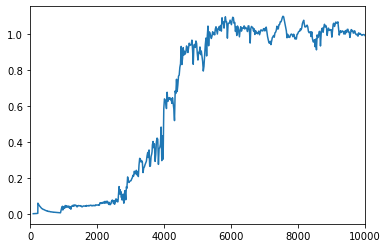

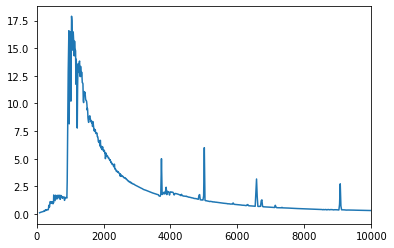

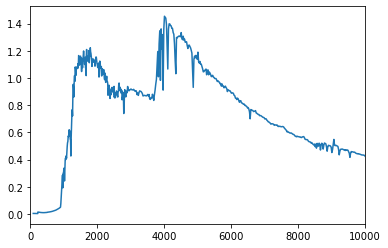

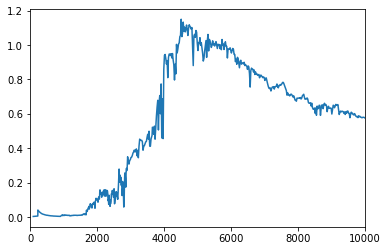

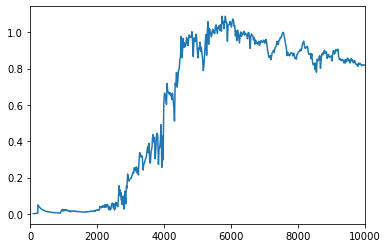

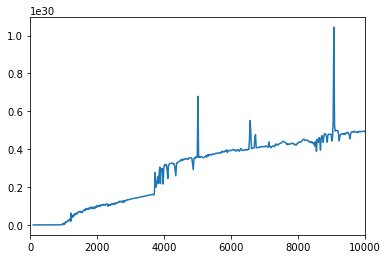

In [27]:
for template in templates:
    #print(template)
    plt.plot(template.wave, template.flux)
    plt.xlim(0,10000)
    plt.show()

In [28]:
templates_grid = []
for template in templates:
    templates_grid.append([])
    for z in z_grid:
        templates_grid[-1].append(template)
        #templates_grid[-1][0] = (template_grid[-1][0] / 10) * (1 + z)
        templates_grid[-1][-1] = templates_grid[-1][-1].redshift(z)
        #template_grid[-1][1] = np.log10(template_grid[-1][1])

In [29]:
g_bp = ps.ArrayBandpass(filter_g[0], filter_g[1])
r_bp = ps.ArrayBandpass(filter_r[0], filter_r[1])
i_bp = ps.ArrayBandpass(filter_i[0], filter_i[1])
y_bp = ps.ArrayBandpass(filter_y[0], filter_y[1])
z_bp = ps.ArrayBandpass(filter_z[0], filter_z[1])
j_bp = ps.ArrayBandpass(j_filter[0], j_filter[1])
h_bp = ps.ArrayBandpass(h_filter[0], h_filter[1])
k_bp = ps.ArrayBandpass(k_filter[0], k_filter[1])
w1_bp = ps.ArrayBandpass(w1_filter[0], w1_filter[1])
w2_bp = ps.ArrayBandpass(w2_filter[0], w2_filter[1])
w3_bp = ps.ArrayBandpass(w3_filter[0], w3_filter[1])

bandpasses = [g_bp, r_bp, i_bp, y_bp, z_bp, j_bp, h_bp, k_bp, w1_bp, w2_bp, w3_bp]

In [30]:
templates_grid_filters = []

for template in templates_grid:
    templates_grid_filters.append([])
    
    for redshift_temp in template:
        try:
            filter_values = []
            for bp in bandpasses:
                filter_values.append(ps.Observation(redshift_temp, bp).effstim('flam'))
                
            templates_grid_filters[-1].append(np.array(filter_values))
        except:
            print("zero flux")
            templates_grid_filters[-1].append(np.array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]))
print(templates_grid_filters)

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
zero flux
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
zero flux
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
zero flux
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
zero flux
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
zero flux
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
zero flux
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
zero flux
(UnnamedArrayBandpass) does not have a defined b

[[array([8.79014717e-01, 1.03089635e+00, 1.01319173e+00, 1.01287013e+00,
       1.10098022e+00, 7.66021553e-01, 5.64385730e-01, 2.81650671e-01,
       6.78905058e-02, 2.00393704e-02, 7.80146895e-04]), array([8.68499236e-01, 1.02587763e+00, 1.00596339e+00, 1.00851946e+00,
       1.10090816e+00, 7.67189877e-01, 5.66083744e-01, 2.84504722e-01,
       6.86838381e-02, 2.03562423e-02, 7.88191383e-04]), array([8.57800722e-01, 1.02090805e+00, 9.99297301e-01, 1.00323148e+00,
       1.10119523e+00, 7.68312985e-01, 5.67500752e-01, 2.87123836e-01,
       6.94759779e-02, 2.06765546e-02, 7.96278471e-04]), array([8.46843737e-01, 1.01595783e+00, 9.93753436e-01, 9.97302310e-01,
       1.10011218e+00, 7.69539309e-01, 5.68628040e-01, 2.89511372e-01,
       7.02657474e-02, 2.10002243e-02, 8.04416915e-04]), array([8.35839557e-01, 1.01097385e+00, 9.88719959e-01, 9.91165500e-01,
       1.09736315e+00, 7.70421024e-01, 5.69505961e-01, 2.91752401e-01,
       7.10546125e-02, 2.13272888e-02, 8.12615994e-04]), arr

# Photometic Redshift Using Chi Squared Minimisation

[1.81432228e-16 1.33630817e-16 1.21711700e-16 1.01805901e-16
 7.76504605e-17 6.44891700e-17 4.71583568e-17 3.66366215e-17
 8.33034271e-18 4.13909162e-18 5.75820118e-18] erg / (Angstrom cm2 s)


/tmp/ipykernel_4222/2014081313.py:29: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  fluxes[fluxes=="null"]=1.2e-5


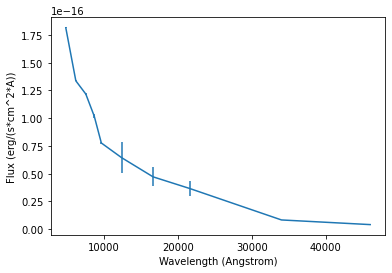

/home/thorsten/anaconda3/lib/python3.9/site-packages/astropy/units/quantity.py:486: RuntimeWarning: divide by zero encountered in true_divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/home/thorsten/anaconda3/lib/python3.9/site-packages/astropy/units/quantity.py:486: RuntimeWarning: invalid value encountered in multiply
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


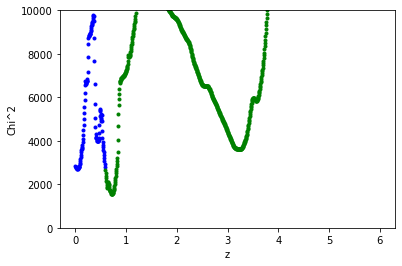

[1.39787219e-16 2.02518929e-16 2.14299470e-16 2.25958443e-16
 1.66901700e-16 1.16382260e-16 6.34393412e-17 5.71104284e-17
 1.35351436e-17 5.33218292e-18 7.23580467e-19] erg / (Angstrom cm2 s)


/tmp/ipykernel_4222/2014081313.py:29: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  fluxes[fluxes=="null"]=1.2e-5


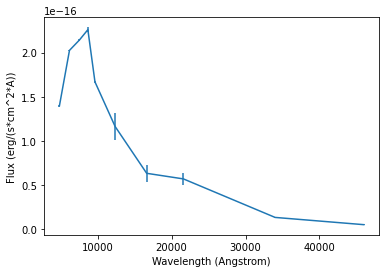

/home/thorsten/anaconda3/lib/python3.9/site-packages/astropy/units/quantity.py:486: RuntimeWarning: divide by zero encountered in true_divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/home/thorsten/anaconda3/lib/python3.9/site-packages/astropy/units/quantity.py:486: RuntimeWarning: invalid value encountered in multiply
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


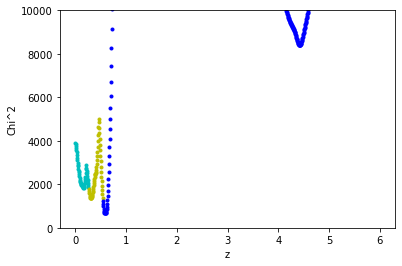

[7.87953423e-16 8.84755912e-16 7.32739551e-16 6.34126229e-16
 4.86613163e-16 3.50821974e-16 1.87567964e-16 8.36210118e-17
 1.54547815e-17 4.34215217e-18 5.53970750e-19] erg / (Angstrom cm2 s)


/tmp/ipykernel_4222/2014081313.py:29: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  fluxes[fluxes=="null"]=1.2e-5


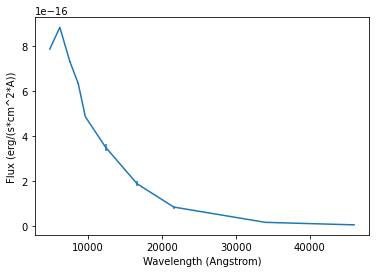

/home/thorsten/anaconda3/lib/python3.9/site-packages/astropy/units/quantity.py:486: RuntimeWarning: divide by zero encountered in true_divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/home/thorsten/anaconda3/lib/python3.9/site-packages/astropy/units/quantity.py:486: RuntimeWarning: invalid value encountered in multiply
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


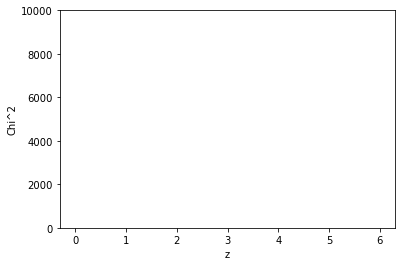

[9.22941108e-17 9.00466478e-17 9.18869277e-17 1.00603860e-16
 6.86619703e-17 7.29603297e-17 5.31078432e-17 4.07300946e-17
 1.07315603e-17 5.66637144e-18 5.18903780e-18] erg / (Angstrom cm2 s)


/tmp/ipykernel_4222/2014081313.py:29: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  fluxes[fluxes=="null"]=1.2e-5


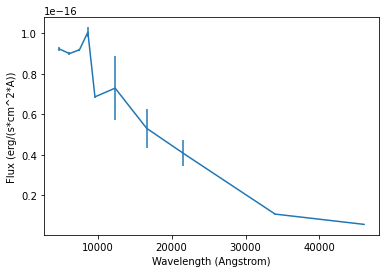

/home/thorsten/anaconda3/lib/python3.9/site-packages/astropy/units/quantity.py:486: RuntimeWarning: divide by zero encountered in true_divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/home/thorsten/anaconda3/lib/python3.9/site-packages/astropy/units/quantity.py:486: RuntimeWarning: invalid value encountered in multiply
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


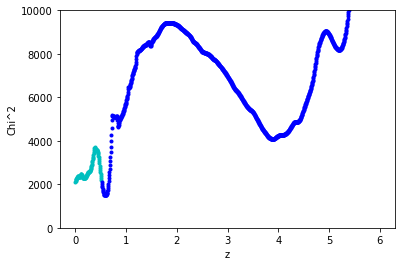

[6.66057040e-17 1.34040316e-16 1.40121634e-16 1.52847164e-16
 1.12510445e-16 7.38391668e-17 4.95174947e-17 4.09558004e-17
 1.13936499e-17 4.30630751e-18 9.20209758e-19] erg / (Angstrom cm2 s)


/tmp/ipykernel_4222/2014081313.py:29: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  fluxes[fluxes=="null"]=1.2e-5


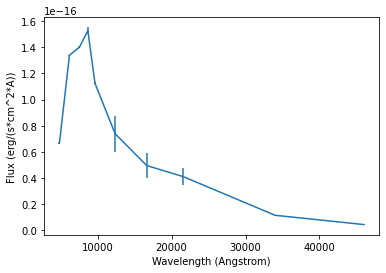

/home/thorsten/anaconda3/lib/python3.9/site-packages/astropy/units/quantity.py:486: RuntimeWarning: divide by zero encountered in true_divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/home/thorsten/anaconda3/lib/python3.9/site-packages/astropy/units/quantity.py:486: RuntimeWarning: invalid value encountered in multiply
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


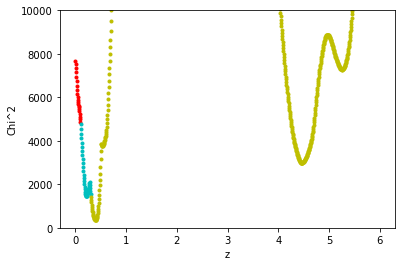

[2.55199552e-15 2.18754806e-15 1.66969698e-15 1.32215027e-15
 1.05053892e-15 6.47271951e-16 3.03080967e-16 1.35867448e-16
 2.82268795e-17 8.13027133e-18 7.05158645e-19] erg / (Angstrom cm2 s)


/tmp/ipykernel_4222/2014081313.py:29: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  fluxes[fluxes=="null"]=1.2e-5


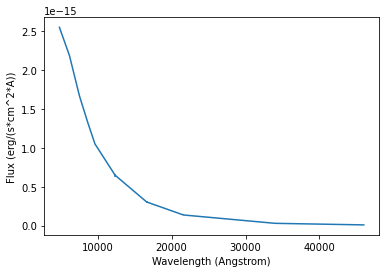

/home/thorsten/anaconda3/lib/python3.9/site-packages/astropy/units/quantity.py:486: RuntimeWarning: divide by zero encountered in true_divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/home/thorsten/anaconda3/lib/python3.9/site-packages/astropy/units/quantity.py:486: RuntimeWarning: invalid value encountered in multiply
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


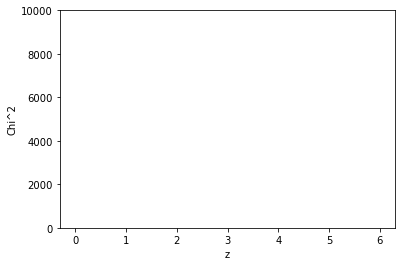

[3.46652958e-17 7.40642652e-17 7.65167812e-17 8.58843831e-17
 5.87696814e-17 4.56128058e-17 3.06449321e-17 2.49296062e-17
 7.57639954e-18 2.73719060e-18 6.33704563e-19] erg / (Angstrom cm2 s)


/tmp/ipykernel_4222/2014081313.py:29: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  fluxes[fluxes=="null"]=1.2e-5


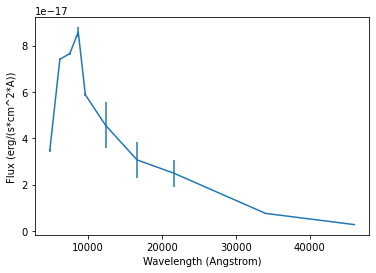

/home/thorsten/anaconda3/lib/python3.9/site-packages/astropy/units/quantity.py:486: RuntimeWarning: divide by zero encountered in true_divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/home/thorsten/anaconda3/lib/python3.9/site-packages/astropy/units/quantity.py:486: RuntimeWarning: invalid value encountered in multiply
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


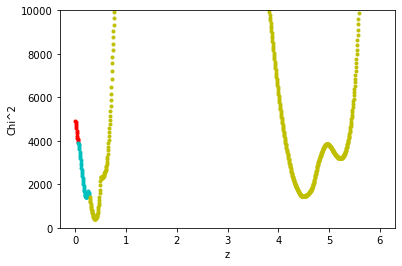

[1.95584711e-16 2.13147024e-16 1.75439638e-16 1.89645050e-16
 1.31813326e-16 9.14295933e-17 8.27863364e-17 4.23755569e-17
 6.44856184e-18 1.50975000e-18 7.63285187e-19] erg / (Angstrom cm2 s)


/tmp/ipykernel_4222/2014081313.py:29: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  fluxes[fluxes=="null"]=1.2e-5


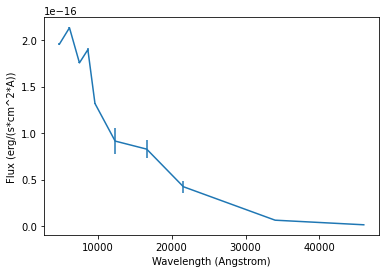

/home/thorsten/anaconda3/lib/python3.9/site-packages/astropy/units/quantity.py:486: RuntimeWarning: divide by zero encountered in true_divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/home/thorsten/anaconda3/lib/python3.9/site-packages/astropy/units/quantity.py:486: RuntimeWarning: invalid value encountered in multiply
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


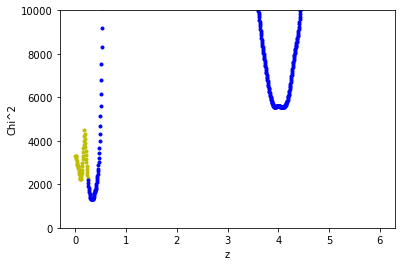

[3.61712487e-15 3.49777412e-15 2.88934261e-15 2.45768283e-15
 1.86044870e-15 1.15740882e-15 5.77508877e-16 2.25276255e-16
 5.30961301e-17 1.56785191e-17 1.10328277e-18] erg / (Angstrom cm2 s)


/tmp/ipykernel_4222/2014081313.py:29: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  fluxes[fluxes=="null"]=1.2e-5


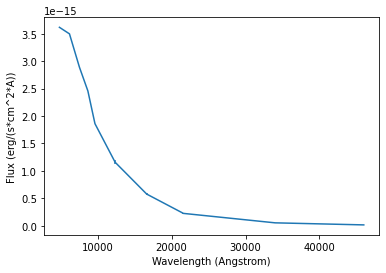

/home/thorsten/anaconda3/lib/python3.9/site-packages/astropy/units/quantity.py:486: RuntimeWarning: divide by zero encountered in true_divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/home/thorsten/anaconda3/lib/python3.9/site-packages/astropy/units/quantity.py:486: RuntimeWarning: invalid value encountered in multiply
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


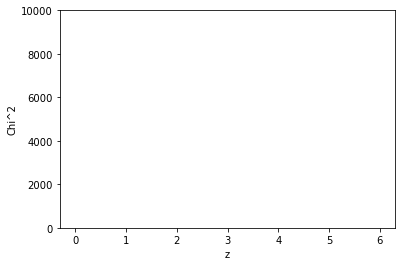

[9.53687311e-17 1.38693658e-16 1.45986502e-16 1.53974840e-16
 1.08490948e-16 9.79685742e-17 7.09183568e-17 6.07456828e-17
 6.54429501e-18 2.91678918e-18 1.15315274e-18] erg / (Angstrom cm2 s)


/tmp/ipykernel_4222/2014081313.py:29: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  fluxes[fluxes=="null"]=1.2e-5


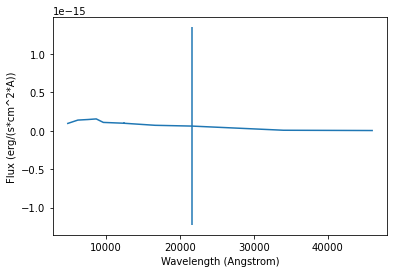

/home/thorsten/anaconda3/lib/python3.9/site-packages/astropy/units/quantity.py:486: RuntimeWarning: divide by zero encountered in true_divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/home/thorsten/anaconda3/lib/python3.9/site-packages/astropy/units/quantity.py:486: RuntimeWarning: invalid value encountered in multiply
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


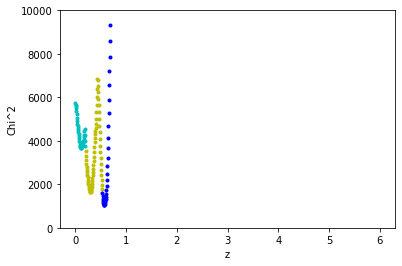

In [33]:
##### ENABLE PLOTTING ########


plotting = True


##############################


redshifts = []
template_match = []
chisqs = []
scalings = []

wave = np.array([0.481, 0.617, 0.752, 0.866, 0.962, 1.235, 1.662, 2.159, 3.4, 4.6, 12.08]) * 10000 * u.Angstrom


for item in mass_wise_matches[:10]:
    fluxes = np.array([item[0]["gKronFlux"], item[0]["rKronFlux"], item[0]["iKronFlux"],
                       item[0]["yKronFlux"], item[0]["zKronFlux"], item[1]["j_m"],
                       item[1]["h_m"], item[1]["k_m"], item[2]["w1mpro"], item[2]["w2mpro"], item[2]["w3mpro"]])
    errs = np.array([item[0]["gKronFluxErr"], item[0]["rKronFluxErr"], item[0]["iKronFluxErr"],
                     item[0]["yKronFluxErr"], item[0]["zKronFluxErr"], item[1]["j_cmsig"], item[1]["h_cmsig"],
                     item[1]["k_cmsig"], item[2]["w1sigmpro"], item[2]["w2sigmpro"], item[2]["w3sigmpro"]])
    scale = []
    chisq = []
    
    
    fluxes[fluxes=="null"]=1.2e-5
    errs[errs=="null"]=1.2e-5
    
    fluxes = fluxes.astype(float)
    errs = errs.astype(float)
    
    fluxes[fluxes==-999]=1.2e-5
    errs[errs==-999]=1.2e-5
    
    fluxes = fluxes * u.Jy
    errs = errs * u.Jy
    
    fluxes = JyToFlambda(fluxes, wave)
    errs = JyToFlambda(errs, wave)
    
    if plotting:
    
        print(fluxes)
        plt.errorbar(wave[:-1].value, fluxes[:-1].value, yerr=errs[:-1].value)
        #plt.plot(wave, templates_grid_filters[2][0][:-1] * fluxes[1] / templates_grid_filters[2][0][1], marker=".", linestyle="None")
        #plt.plot(wave, templates_grid_filters[2][20][:-1] * fluxes[1] / templates_grid_filters[2][0][1], marker=".", linestyle="None")
        #plt.plot(wave, templates_grid_filters[2][40][:-1] * fluxes[1] / templates_grid_filters[2][0][1], marker=".", linestyle="None")
        #plt.plot(wave, templates_grid_filters[2][60][:-1] * fluxes[1] / templates_grid_filters[2][0][1], marker=".", linestyle="None")
        #plt.plot(wave, templates_grid_filters[2][80][:-1] * fluxes[1] / templates_grid_filters[2][0][1], marker=".", linestyle="None")
        #plt.plot(wave, templates_grid_filters[2][100][:-1] * fluxes[1] / templates_grid_filters[2][0][1], marker=".", linestyle="None")
        plt.xlabel("Wavelength (Angstrom)")
        plt.ylabel("Flux (erg/(s*cm^2*A))")
        plt.show()
    
    
    
    for template in templates_grid_filters:
        scale.append([])
        chisq.append([])
        for redshifted_temp in template:
            redshifted_temp = redshifted_temp * u.erg / u.s /u.cm**2 / u.angstrom
            a0 = fluxes[1] / redshifted_temp[1]
            scale[-1].append(a0)
            chisq[-1].append(chisqfunc(a0, fluxes, redshifted_temp, errs).value)
    
    chisqs.append([])
    temp_min = np.inf
    temp_match = None
    argmin = None
    # going through chi squared at each redshift in the grid
    for i in range(len(chisq[0])):
        # chi squared at each redshift
        chi_red = [chisq[0][i], chisq[1][i], chisq[2][i], chisq[3][i], chisq[4][i], chisq[5][i]]
        chisq_min = min(chi_red)
        chisqs[-1].append(chisq_min)
        #finding best fitting template and resdshift
        if chisq_min < temp_min:
            temp_min = chisq_min
            temp_match = np.argmin(chi_red)
            argmin = i
        if temp_match == 0:
            color = "r"
        elif temp_match == 1:
            color = "g"
        elif temp_match == 2:
            color = "b"
        elif temp_match == 3:
            color = "y"
        elif temp_match == 4:
            color = "c"
        elif temp_match == 5:
            color = "m"
            
        if plotting:
            plt.plot(i * grid_size, chisq_min, color + ".")
            
    if plotting:
        plt.xlabel("z")
        plt.ylabel("Chi^2")
        plt.ylim(0,10000)
        plt.show()
    
    #get the scaling for the template at the fitting redshift
    scalings.append(scale[temp_match][argmin])
    
    try:
        redshifts.append(argmin*grid_size)
        template_match.append(temp_match)
    except:
        redshifts.append(np.nan)
        template_match.append(np.nan)
    

In [34]:
chisqs_min = []

for item in chisqs:
    chisqs_min.append(min(item))

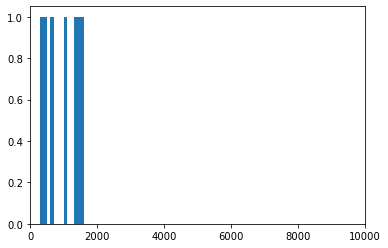

In [35]:
bins = np.arange(0, 100000, 100)

plt.hist(chisqs_min, bins = bins)
plt.xlim(0, 10000)
plt.show()

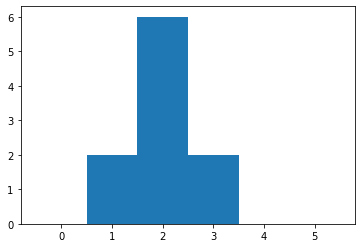

399


In [36]:
plt.hist(template_match, bins=[-0.5,0.5,1.5,2.5,3.5,4.5,5.5])
plt.show()
print(len(sources))

[1.81432228e-16 1.33630817e-16 1.21711700e-16 1.01805901e-16
 7.76504605e-17 6.44891700e-17 4.71583568e-17 3.66366215e-17
 8.33034271e-18 4.13909162e-18 5.75820118e-18]


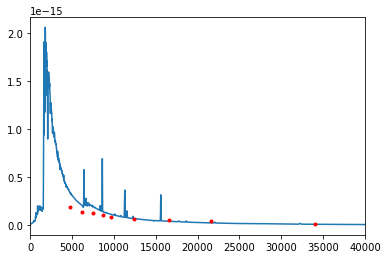

4.884314853334284e-12 erg / (cm2 s)
9.514932343722437e+18 cm
[1.39787219e-16 2.02518929e-16 2.14299470e-16 2.25958443e-16
 1.66901700e-16 1.16382260e-16 6.34393412e-17 5.71104284e-17
 1.35351436e-17 5.33218292e-18 7.23580467e-19]


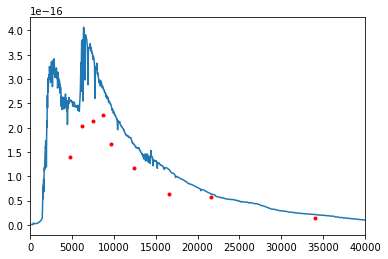

4.62269837394782e-12 erg / (cm2 s)
7.796958448328107e+18 cm
[7.87953423e-16 8.84755912e-16 7.32739551e-16 6.34126229e-16
 4.86613163e-16 3.50821974e-16 1.87567964e-16 8.36210118e-17
 1.54547815e-17 4.34215217e-18 5.53970750e-19]


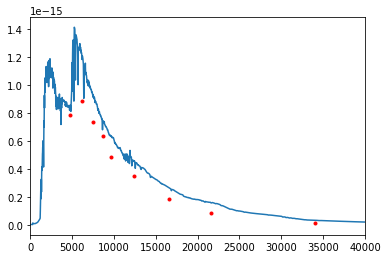

1.3273181511549144e-11 erg / (cm2 s)
4.162782900378565e+18 cm
[9.22941108e-17 9.00466478e-17 9.18869277e-17 1.00603860e-16
 6.86619703e-17 7.29603297e-17 5.31078432e-17 4.07300946e-17
 1.07315603e-17 5.66637144e-18 5.18903780e-18]


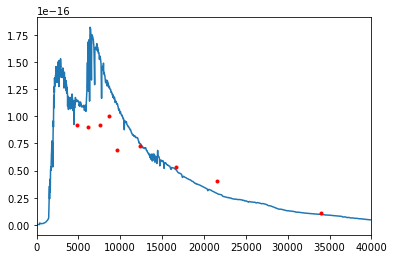

2.075358415779919e-12 erg / (cm2 s)
7.863034367381735e+18 cm
[6.66057040e-17 1.34040316e-16 1.40121634e-16 1.52847164e-16
 1.12510445e-16 7.38391668e-17 4.95174947e-17 4.09558004e-17
 1.13936499e-17 4.30630751e-18 9.20209758e-19]


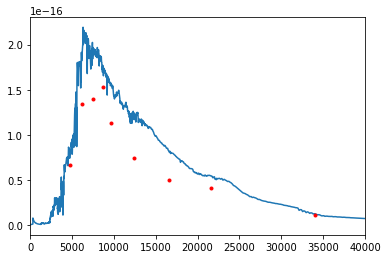

2.6026223947082068e-12 erg / (cm2 s)
5.286073524290242e+18 cm
[2.55199552e-15 2.18754806e-15 1.66969698e-15 1.32215027e-15
 1.05053892e-15 6.47271951e-16 3.03080967e-16 1.35867448e-16
 2.82268795e-17 8.13027133e-18 7.05158645e-19]


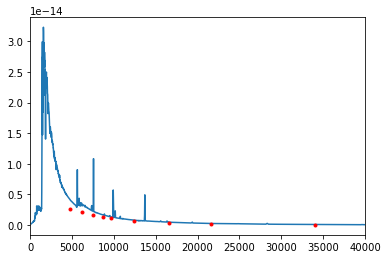

6.734030704474707e-11 erg / (cm2 s)
6.739743743470058e+18 cm
[3.46652958e-17 7.40642652e-17 7.65167812e-17 8.58843831e-17
 5.87696814e-17 4.56128058e-17 3.06449321e-17 2.49296062e-17
 7.57639954e-18 2.73719060e-18 6.33704563e-19]


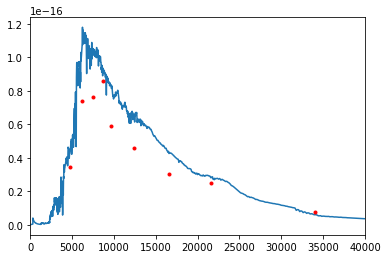

1.3853908248650412e-12 erg / (cm2 s)
5.087845767129358e+18 cm
[1.95584711e-16 2.13147024e-16 1.75439638e-16 1.89645050e-16
 1.31813326e-16 9.14295933e-17 8.27863364e-17 4.23755569e-17
 6.44856184e-18 1.50975000e-18 7.63285187e-19]


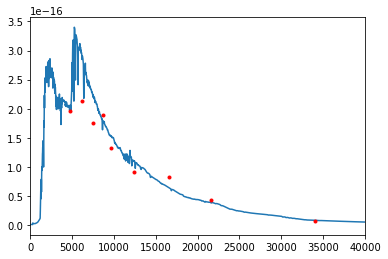

3.197649308758052e-12 erg / (cm2 s)
4.162782900378565e+18 cm
[3.61712487e-15 3.49777412e-15 2.88934261e-15 2.45768283e-15
 1.86044870e-15 1.15740882e-15 5.77508877e-16 2.25276255e-16
 5.30961301e-17 1.56785191e-17 1.10328277e-18]


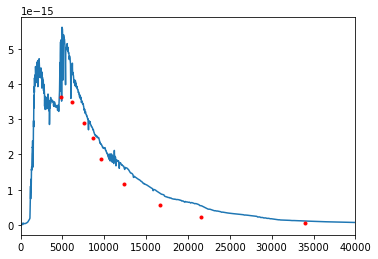

4.9527603105757137e-11 erg / (cm2 s)
3.105568195520517e+18 cm
[9.53687311e-17 1.38693658e-16 1.45986502e-16 1.53974840e-16
 1.08490948e-16 9.79685742e-17 7.09183568e-17 6.07456828e-17
 6.54429501e-18 2.91678918e-18 1.15315274e-18]


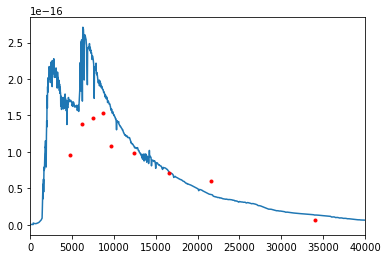

3.0416641633814423e-12 erg / (cm2 s)
7.532654772113595e+18 cm


IndexError: list index out of range

In [37]:
luminosities = []

for i in range(len(mass_wise_matches)):
    item = mass_wise_matches[i]
    fluxes = np.array([item[0]["gKronFlux"], item[0]["rKronFlux"], item[0]["iKronFlux"],
                       item[0]["yKronFlux"], item[0]["zKronFlux"], item[1]["j_m"],
                       item[1]["h_m"], item[1]["k_m"], item[2]["w1mpro"], item[2]["w2mpro"], item[2]["w3mpro"]])
    wave = np.array([0.481, 0.617, 0.752, 0.866, 0.962, 1.235, 1.662, 2.159, 3.4, 4.6, 12.08]) * 10000 * u.Angstrom
    
    fluxes = fluxes * u.Jy
    
    fluxes = JyToFlambda(fluxes, wave)
    
    z = redshifts[i]
    scale = scalings[i]
    
    temp_wave = templates[template_match[i]].wave
    temp_flux = templates[template_match[i]].flux
    temp_flux = temp_flux * scale
    temp_wave = temp_wave * (1+z)
    
    print(fluxes.value)
    plt.plot(temp_wave, temp_flux)
    plt.plot(wave.value, fluxes.value, "r.")
    plt.xlim(0, 40000)
    plt.show()
    
    
    flux_tot = integrate.simps(temp_flux, x=temp_wave) * u.erg / u.s / u.cm**2
    print(flux_tot)
    c = 299792458 * 100 * u.cm / u.s
    dist = c * z / (70 * u.km / u.s / u.mpc)
    dist = dist.to(u.cm)
    print(dist)
    lum = 4 * np.pi * dist**2 * flux_tot
    luminosities.append(lum)

In [38]:
lum_solar = []

for item in luminosities:
    lum_solar.append(item.to(u.solLum).value)

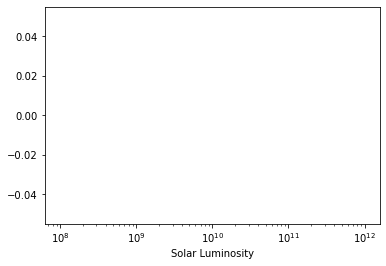

In [39]:
bins = np.logspace(8, 12, 25)

plt.hist(lum_solar, bins=bins)
plt.xlabel("Solar Luminosity")
plt.xscale("log")

# Photometric Redshfit Using MCMC

In [40]:
interp_func = interpolate.interp1d(z_grid, templates_grid_filters, axis=1)     

In [41]:
def model(z, temp_fac):
    
    temp_filters = np.zeros(len(bandpasses))
    temp_fac = temp_fac / np.sum(temp_fac)
    
    temp_values = interp_func(z)
    
    for i in range(len(templates[:-1])):       
        for k in range(len(bandpasses)):
            temp_filters[k] += temp_fac[i] * temp_values[i][k]
            
    return temp_filters

In [87]:
def lnlike(theta, y, yerr):
    
    z = theta[0]
    lnscale = theta[1]
    temp_fac = np.array(theta[2:])
    
    temp_filters = model(z, temp_fac)
    temp_filters = np.array(temp_filters) * u.erg / u.s /u.cm**2 / u.angstrom
    #scale = y[1]/temp_filters[1]
    
    Lnlike =  -0.5 * np.sum((y - np.e**scale * temp_filters) ** 2 / yerr**2)
    
    return Lnlike.value

In [89]:
def lnprior(theta):
    z = theta[0]
    lnscale = theta[1]
    temp_fac = theta[2:]
    
    if (not 0 < z < 5.99) or any(t < 0 for t in temp_fac):
        return -np.inf
    return np.log(z**2) - lnscale

In [44]:
def lnprob(theta, y, yerr):
    lp = lnprior(theta)
    if lp == -np.inf:
        return -np.inf
    return lp + lnlike(theta, y, yerr)

In [88]:
nwalkers = 50
niter = 10000
initial = np.array([0.5, -16, 1/5, 1/5, 1/5, 1/5, 1/5])
ndim = len(initial)
p0 = [np.array(initial) + np.array([0.1, 1e-16, 0.1, 0.1, 0.1, 0.1, 0.1]) * np.random.randn(ndim) for i in range(nwalkers)]

In [55]:
def main(p0, nwalkers, niter, ndim, lnprob, data):
    #with Pool() as pool:
    sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob, args=data)

    print("Running burn-in...")
        #a = sampler.run_mcmc(p0, 0)
        #print(a)
    #sampler.reset()

    print("Running production...")
    pos, prob, state = sampler.run_mcmc(p0, niter, progress=True)

    return sampler, pos, prob, state

In [90]:
wave = np.array([0.481, 0.617, 0.752, 0.866, 0.962, 1.235, 1.662, 2.159, 3.4, 4.6, 12.08]) * 10000 * u.Angstrom
samplers = []

for item in mass_wise_matches[1:2]:
    
    fluxes = np.array([item[0]["gKronFlux"], item[0]["rKronFlux"], item[0]["iKronFlux"],
                       item[0]["yKronFlux"], item[0]["zKronFlux"], item[1]["j_m"],
                       item[1]["h_m"], item[1]["k_m"], item[2]["w1mpro"], item[2]["w2mpro"], item[2]["w3mpro"]])
    errs = np.array([item[0]["gKronFluxErr"], item[0]["rKronFluxErr"], item[0]["iKronFluxErr"],
                     item[0]["yKronFluxErr"], item[0]["zKronFluxErr"], item[1]["j_cmsig"], item[1]["h_cmsig"],
                     item[1]["k_cmsig"], item[2]["w1sigmpro"], item[2]["w2sigmpro"], item[2]["w3sigmpro"]])
    
    fluxes[fluxes=="null"]=1.2e-5
    errs[errs=="null"]=1.2e-5
    
    fluxes = fluxes.astype(float)
    errs = errs.astype(float)
    
    fluxes[fluxes==-999]=1.2e-5
    errs[errs==-999]=1.2e-5
    
    fluxes = fluxes * u.Jy
    errs = errs * u.Jy
    
    fluxes = JyToFlambda(fluxes, wave)
    errs = JyToFlambda(errs, wave)
    
    data = (fluxes, errs)
    
    print(fluxes)
    
    sampler, pos, prob, state = main(p0,nwalkers,niter,ndim,lnprob,data)
    samplers.append(sampler)  

/tmp/ipykernel_4222/1498201348.py:13: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  fluxes[fluxes=="null"]=1.2e-5


[1.39787219e-16 2.02518929e-16 2.14299470e-16 2.25958443e-16
 1.66901700e-16 1.16382260e-16 6.34393412e-17 5.71104284e-17
 1.35351436e-17 5.33218292e-18 7.23580467e-19] erg / (Angstrom cm2 s)
Running burn-in...
Running production...


  0%|          | 0/10000 [00:00<?, ?it/s]/home/thorsten/anaconda3/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
100%|██████████| 10000/10000 [02:04<00:00, 80.58it/s]


In [91]:
samples = samplers[0].get_chain(flat=True)
print(samples)

[[4.89033044e-001 7.22644641e-017 1.59887001e-001 ... 7.55700428e-002
  8.82541667e-002 1.73772564e-001]
 [5.66066329e-001 1.10874460e-016 1.89455967e-001 ... 3.74463526e-001
  1.26849516e-001 3.60618267e-001]
 [6.48841858e-001 9.52731580e-017 1.22832208e-001 ... 2.87930097e-001
  1.85873016e-001 2.60711237e-001]
 ...
 [5.34076227e-001 2.85336687e-016 1.86727378e+216 ... 1.43231533e+218
  4.66236200e+217 5.60862963e+213]
 [5.35491889e-001 2.84961650e-016 1.07040053e+216 ... 8.11925589e+217
  2.63604597e+217 4.96456643e+213]
 [5.39291516e-001 2.84425930e-016 1.96483081e+215 ... 1.41035386e+217
  4.51898167e+216 2.01944930e+213]]


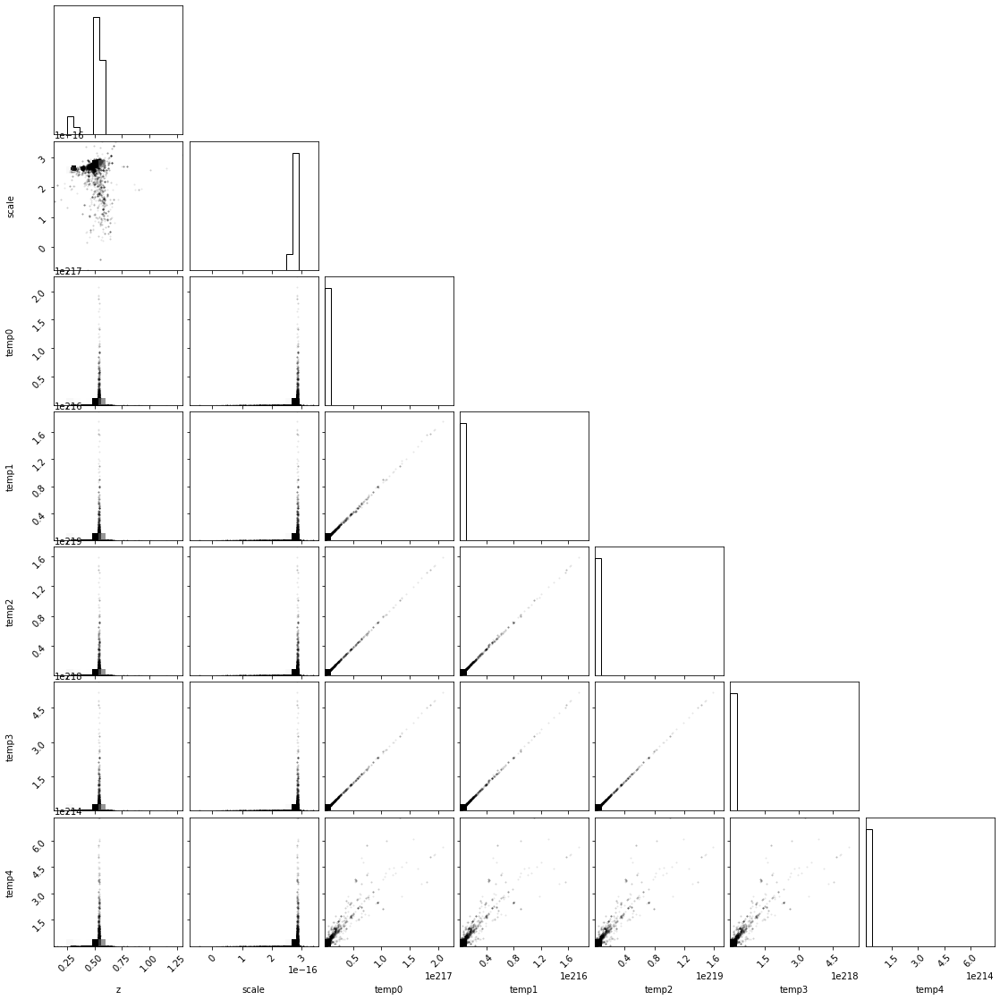

In [93]:
labels = ["z", "scale", "temp0", "temp1", "temp2", "temp3", "temp4"]

fig = corner.corner(
    samples, labels=labels)

In [81]:
from IPython.display import display, Math

for i in range(ndim):
    mcmc = np.percentile(samples[:, i], [16, 50, 84])
    q = np.diff(mcmc)
    txt = "\mathrm{{{3}}} = {0:.3f}_{{-{1:.3f}}}^{{{2:.3f}}}"
    txt = txt.format(mcmc[1], q[0], q[1], labels[i])
    display(Math(txt))

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

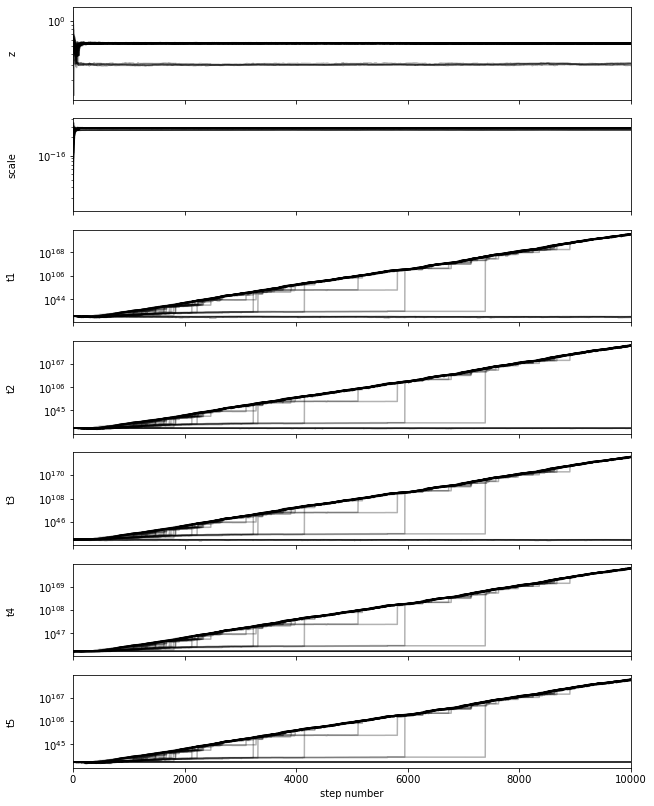

In [95]:
fig, axes = plt.subplots(7, figsize=(10, 14), sharex=True)
samples = sampler.get_chain()
labels = ["z", "scale", "t1", "t2", "t3", "t4", "t5"]
for i in range(ndim):
    ax = axes[i]
    ax.semilogy()
    ax.plot(samples[:, :, i], "k", alpha=0.3)
    ax.set_xlim(0, len(samples))
    ax.set_ylabel(labels[i])
    ax.yaxis.set_label_coords(-0.1, 0.5)

axes[-1].set_xlabel("step number"); 